In [60]:
# Libraries
library(Seurat)
library(SeuratHelper)
library(dplyr)
library(stringr)
library(tidyr)
library(ggplot2)
library(readxl)
library(cowplot)

In [61]:
devtools::load_all("~/projects/SeuratHelper")

ℹ Loading SeuratHelper


In [62]:
# Adjust PATH
wd <- getwd()
subdir <- "/bin"
if (endsWith(wd, subdir)) {
    wd <- str_remove(wd, subdir)
    setwd(wd)
}
getwd()

[1] "/vol/projects/odietric/covid19-bal-atlas-integration"

In [63]:
# Variables
in_file <- "data/BCB/filtered_feature_bc_matrix.h5"
in_aggr_csv <- "data/BCB/aggregation.csv"
in_meta <- "data/BCB/tidy-meta-data.csv"
url_markers <- "https://syncandshare.desy.de/index.php/s/B4PDcHA8Jg8zZBm"
url_markers <- paste0(url_markers, "/download")
in_markers <- "docs/celltype/markers.xlsx"
in_meta_promac <- "docs/celltype/covid-profibrotic-macrophages-meta.csv"
url_overview <- "https://syncandshare.desy.de/index.php/s/CrDgDwHRQNDWYcj"
url_overview <- paste0(url_overview, "/download")
in_overview <- "docs/overview.xlsx"
plot_dir <- "analysis/BCB/"
out_file <- "data/BCB/seurat.Rds"

In [64]:
# Download data
download.file(url_markers, in_markers)
download.file(url_overview, in_overview)

In [65]:
# Read data
aggr_csv <- read.csv(in_aggr_csv)
meta_data <- read.csv(in_meta, row.names = "X")
meta_promac <- read.csv(in_meta_promac)
sheets <- excel_sheets(in_markers)
markers <- list()
for (i in sheets) {
    markers[[i]] <- read_excel(in_markers, i)
}
sheets <- excel_sheets(in_overview)
overview <- list()
for (i in sheets) {
    overview[[i]] <- read_excel(in_overview, i)
}

New names:
• `` -> `...3`
• `` -> `...4`
New names:
• `` -> `...3`
New names:
• `` -> `...4`
• `` -> `...5`
New names:
• `` -> `...14`
New names:
• `` -> `...1`
• `` -> `...2`
• `` -> `...3`
• `` -> `...4`
• `` -> `...5`
• `` -> `...6`
• `` -> `...7`
• `` -> `...9`
• `` -> `...10`
• `` -> `...12`
• `` -> `...14`
• `` -> `...15`
• `` -> `...16`
• `` -> `...17`
• `` -> `...18`
• `` -> `...19`
• `` -> `...20`
• `` -> `...22`
• `` -> `...23`
• `` -> `...24`
• `` -> `...25`
• `` -> `...26`
• `` -> `...28`
• `` -> `...29`
• `` -> `...30`
• `` -> `...31`
• `` -> `...32`
• `` -> `...33`
• `` -> `...35`
• `` -> `...36`
• `` -> `...37`
• `` -> `...38`
• `` -> `...39`
• `` -> `...41`
• `` -> `...42`
• `` -> `...43`
• `` -> `...44`
• `` -> `...45`
• `` -> `...46`
• `` -> `...47`
• `` -> `...48`
• `` -> `...49`
• `` -> `...50`
• `` -> `...51`
• `` -> `...53`
• `` -> `...55`
• `` -> `...56`
• `` -> `...57`
• `` -> `...58`
• `` -> `...59`
• `` -> `...60`
• `` -> `...61`
• `` -> `...62`
• `` -> `...63

In [66]:
# Read data
mtx <- Read10X_h5(in_file)

Genome matrix has multiple modalities, returning a list of matrices for this genome



In [67]:
# Separate counts by type
hto <- mtx[['Antibody Capture']]
mtx <- mtx[['Gene Expression']]
rownames(mtx) <- make.unique(rownames(mtx), sep="-")

In [68]:
# Separate viral counts
viral_genes <- tail(rownames(mtx), 5)
index <- which(rownames(mtx) %in% viral_genes)
viral <- mtx[index, ]
index <- which(!rownames(mtx) %in% viral_genes)
mtx <- mtx[index, ]

In [69]:
# Create Seurat object
ds <- CreateSeuratObject(mtx, "BCB")
ds[["HTO"]] <- CreateAssayObject(hto)
ds[["VIRAL"]]  <- CreateAssayObject(viral)
ds

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


An object of class Seurat 
36620 features across 350681 samples within 3 assays 
Active assay: RNA (36601 features, 0 variable features)
 2 other assays present: HTO, VIRAL

In [70]:
# Add meta data
index <- str_split(colnames(ds), "-", simplify=TRUE)[, 2]
ds$libname <- factor(aggr_csv[index, ][, 1])

In [71]:
# Add meta data
names(overview)
index <- !is.na(overview$libraries$run)
data <- overview$libraries[index, ]
index <- match(ds$libname, data$libname)
ds@meta.data <- cbind(ds@meta.data, data[index, c("TotalSeq-A", "sample")])

[1] "libraries"                    "patients"                    
[3] "samples"                      "examinations"                
[5] "hto_features"                 "hto_indices"                 
[7] "clinical_meta_data_variables" "Lung Mechanics"

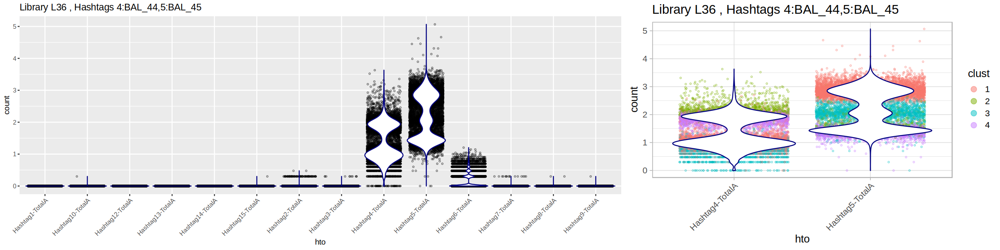

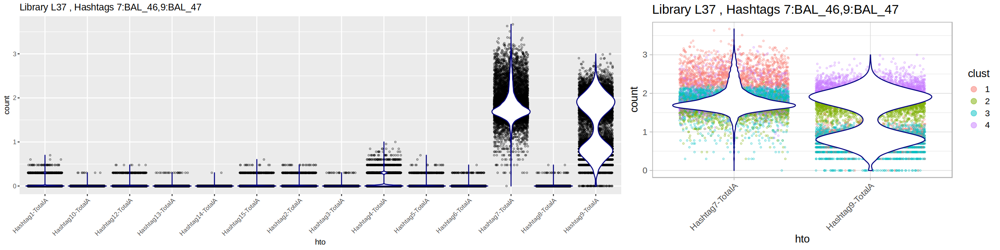

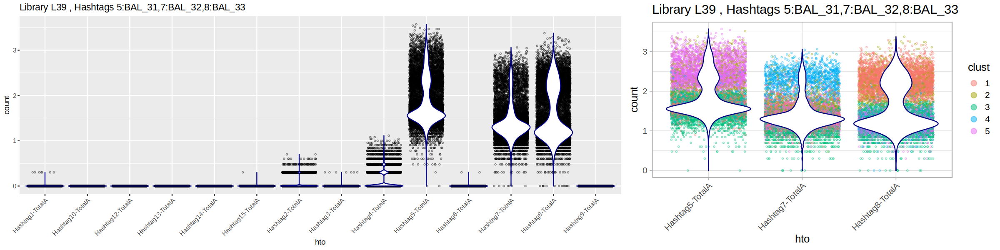

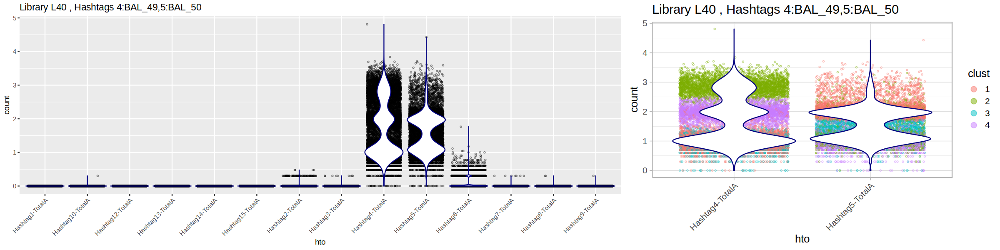

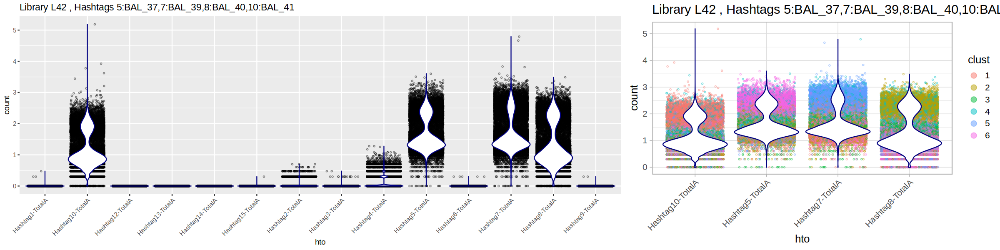

In [72]:
# De-multiplex samples from libraries
options(repr.plot.width=20, repr.plot.height=5)
set.seed(42)
ind <- data$libname[which(!is.na(data[["TotalSeq-A"]]))]
ds$hto_clust <- "None"
for (i in ind) {
    index <- data$sample[data$libname == i]
    index <- str_split(index, ",", simplify = TRUE)[1, ]
    
    index <- str_split(index, ":", simplify = TRUE)
    index <- as.data.frame(index)
    colnames(index) <- c("Hashtag", "Sample")
    index$Hashtag <- paste0("Hashtag", index$Hashtag, "-TotalA")
    
    # Sample overview
    cells <- colnames(ds)[ds$libname == i]
    df <- as.data.frame(t(as.matrix(ds[["HTO"]]@counts[, cells])))
    df <- log10(df+1)
    df <- tidyr::gather(df, "hto", "count")
    
    p <- ggplot(df, aes(hto, count)) +
      geom_point(position = "jitter", size=.5, shape = 21, alpha = .5) +
      geom_violin(scale = "width", col = "navy") +
      labs(title = paste0("Library ", i, " , Hashtags ", data$sample[data$libname == i])) +
      theme(
        axis.text.x = element_text(angle = 45, hjust=1, vjust=1)
      )

    # Barcode clusters
    df <- as.data.frame(t(as.matrix(ds[["HTO"]]@counts[index$Hashtag, cells])))
    df <- as.data.frame(log10(df+1))
    df$clust <- factor(kmeans(df, nrow(index)+2)$cluster)
    ds$hto_clust[ds$libname == i] <- paste0(i, ":", as.character(df$clust))
    df$bc <- row.names(df)
    df <- tidyr::gather(df, "hto", "count", -clust, -bc)
    
    p2 <- ggplot(df, aes(hto, count, col = clust)) +
      geom_point(position = "jitter", size=.5, shape = 21, alpha = .5) +
      geom_violin(scale = "width", col = "navy") +
      labs(title = paste0("Library ", i, " , Hashtags ", data$sample[data$libname == i])) +
      theme_light(15) +
      theme(
        axis.text.x = element_text(angle = 45, hjust=1, vjust=1)
      ) +
      ggplot2::guides(
        color = guide_legend(override.aes = list(size=5, shape=20))
      )

    print(plot_grid(p, p2, rel_widths = c(1.5, 0.9)))
}

`summarise()` has grouped output by 'libname', 'hto'. You can override using
the `.groups` argument.
Warning message in eval(expr, envir, enclos):
“Clusters L39:2L42:4 are duplicated”


[1] "Unassigned cluster: L37:3" "Unassigned cluster: L39:3"
[3] "Unassigned cluster: L40:3" "Unassigned cluster: L42:3"


[1] "BAL_1"     "BAL_2"     "BAL_3"     "BAL_4"     "BAL_5"     "BAL_6"    
 [7] "BAL_7"     "BAL_8"     "BAL_9"     "BAL_13"    "BAL_14"    "BAL_15"   
[13] "BAL_16"    "BAL_17"    "BAL_19"    "BAL_20"    "BAL_21"    "BAL_22"   
[19] "BAL_23"    "BAL_24"    "BAL_25"    "BAL_26"    "BAL_27"    "BAL_28"   
[25] "BAL_30"    "BAL_31"    "BAL_32"    "BAL_33"    "BAL_34"    "BAL_35"   
[31] "BAL_36"    "BAL_42"    "BAL_43"    "BAL_44"    "BAL_45"    "Undefined"
[37] "BAL_47"    "BAL_46"    "BAL_48"    "Doublet"   "BAL_49"    "BAL_50"   
[43] "BAL_51"    "BAL_41"    "BAL_39"    "BAL_37"    "BAL_40"    "BAL_52"   
[49] "BAL_53"

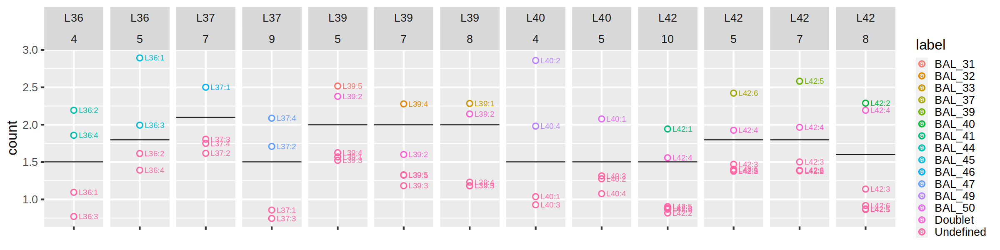

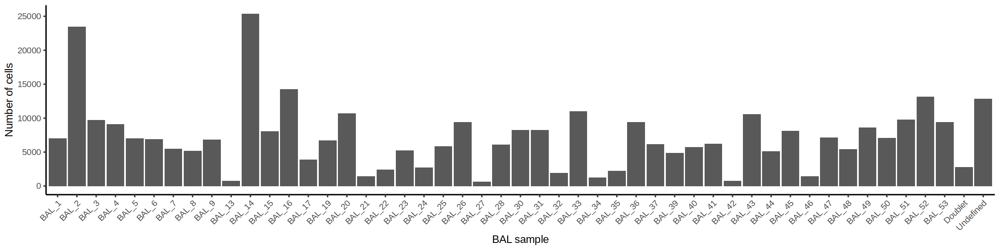

In [73]:
# Select clusters for hashtags using thresholds
hto_thresh <- c(
    "L36:4" = 1.5,
    "L36:5" = 1.8,
    "L37:7" = 2.1,
    "L37:9" = 1.5,
    "L39:5" = 2,
    "L39:7" = 2,
    "L39:8" = 2,
    "L40:4" = 1.5,
    "L40:5" = 1.5,
    "L42:5" = 1.8,
    "L42:7" = 1.8,
    "L42:8" = 1.6,
    "L42:10" = 1.5
)

# Fetch expression data
dat <- as.data.frame(Matrix::t(ds[["HTO"]]@counts))
dat$libname <- ds$libname
dat$clust <- ds$hto_clust
dat <- gather(dat, "hto", "count", -libname, -clust)
dat$count <- log10(dat$count + 1)

# Summarize
dat <- summarize(group_by(dat, libname, hto, clust), count = mean(count))
dat$ht <- str_split(dat$hto, "-", simplify=TRUE)[,1]
dat$ht <- str_remove(dat$ht, "Hashtag")
dat$id <- paste(dat$libname, dat$ht, sep = ":")

# Subset
dat <- dat[dat$libname %in% ind, ]
dat <- dat[dat$count > 0.5, ]
dat <- dat[dat$id %in% names(hto_thresh), ]

# Add thresholds
dat$thresh <- hto_thresh[dat$id]

# Add assignment
dat$assign <- "Undefined"
index <- which(dat$count >= dat$thresh)
dat$assign[index] <- dat$id[index]

# Assign doublet clusters
sub <- dat[dat$count >= dat$thresh, ]
if (any(duplicated(sub$clust))) {
    x <- unique(sub$clust[duplicated(sub$clust)])
    warning("Clusters ", x, " are duplicated")
    index <- which(dat$clust %in% x)
}
dat$assign[index] <- "Doublet"

# Assign hto cluster to cells
sub <- dat[dat$count >= dat$thresh, ]
sub <- unique(sub[, c("clust", "assign")])
c2l <- sub$assign
names(c2l) <- sub$clust
c2l <- c(c2l, c("None"="None"))
ds$hto_assign <- c2l[ds$hto_clust]

# Assign unassigned clusters
index <- which(is.na(ds$hto_assign))
print(paste("Unassigned cluster:", unique(ds$hto_clust[index])))
ds$hto_assign[index] <- "Undefined"

# Convert combination of libname:hashtag to sample
x <- overview$libraries[overview$libraries$libname %in% ind, c("libname", "sample")]
c2l <- c("None"="None", "Undefined"="Undefined", "Doublet"="Doublet")
for (i in x$libname) {
    index <- which(x$libname == i)
    y <- unlist(str_split(x$sample[index], ","))
    z <- str_split(y, ":", simplify=TRUE)
    y <- z[,2]
    names(y) <- paste(rep(i, length(y)), z[,1], sep=":")
    c2l <- c(c2l, y)
}

# Assign cells to sample
dat$label <- c2l[dat$assign]
ds$hto_assign <- c2l[ds$hto_assign]
index <- which(ds$libname %in% ind)
ds$sample[index] <- ds$hto_assign[index]
unique(ds$sample)

# Plot
options(repr.plot.width=20, repr.plot.height=5)
ggplot(dat, aes("", count, col=label, label=clust)) +
geom_point(shape=21, size=3, stroke=1) +
geom_text(nudge_x = .3) +
geom_hline(aes(yintercept = thresh)) +
facet_wrap(libname~ht, nrow=1) +
theme_grey(20) +
guides(color = guide_legend(ncol = 1)) +
labs(x = NULL)

# Plot
df <- as.data.frame(table(ds$sample))
df$num <- as.numeric(str_split(df$Var1, "_", simplify = TRUE)[,2])
df <- df[order(df$num), ]
df$Var1 <- factor(df$Var1, unique(df$Var1))
ggplot(df, aes(Var1, Freq)) + geom_col() + theme_classic(15) + theme(axis.text.x = element_text(angle=45, hjust=1, vjust=1)) +
labs(x = "BAL sample", y = "Number of cells")

In [74]:
# Add meta data
ds$lib_sample <- paste(ds$libname, ds$sample, sep = ":")
meta_data$lib_sample <- paste(meta_data$libname, meta_data$sample, sep = ":")
index <- match(ds$lib_sample, meta_data$lib_sample)
ds@meta.data <- cbind(ds@meta.data, meta_data[index, ])

In [75]:
# Quality control - Metrics
ds <- add_qc_metrics(ds)

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5728 rows containing non-finite values (`stat_bin2d()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5728 rows containing non-finite values (`stat_bin2d()`).”


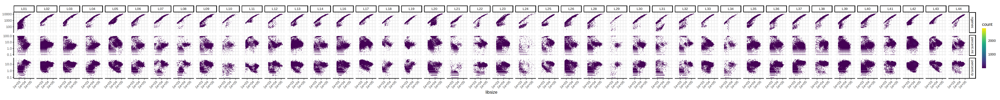

In [76]:
# Plot
options(repr.plot.width=50, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "libname", split_by_max = 50)
fn <- paste0(plot_dir, "qc_lib", ".", "png")
ggsave(fn, width = 50, height = 5, bg="white", limitsize = FALSE)

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 17534050)”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5728 rows containing non-finite values (`stat_bin2d()`).”


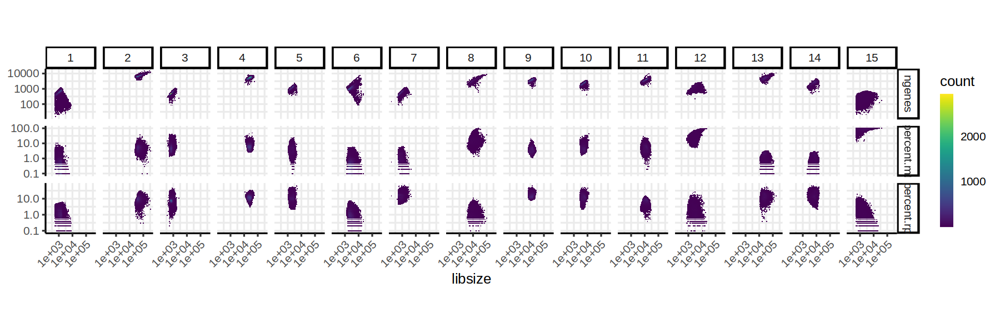

In [77]:
# Quality control - Clusters
set.seed(42)
df <- ds@meta.data[, c("libsize", "ngenes", "percent.mt", "percent.rp")]
df <- log1p(df)
ds$qc_cluster <- factor(kmeans(df, centers = 15)$cluster)

# Plot
options(repr.plot.width=15, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "qc_cluster", split_by_max = 15)

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”


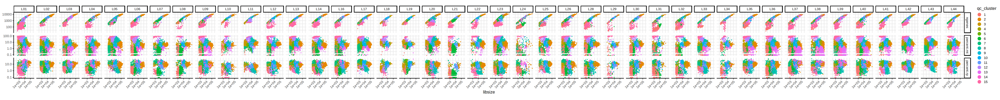

In [78]:
# Plot
options(repr.plot.width=50, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "libname", color_by = "qc_cluster", split_by_max = 50)
fn <- paste0(plot_dir, "qc_lib-cluster", ".", "png")
ggsave(fn, width = 50, height = 5, bg="white", limitsize = FALSE)

,libsize,ngenes,percent.mt,percent.rp
,<dbl>,<dbl>,<dbl>,<dbl>
1,444.44,224.74,0.67,0.94
2,19355.44,2662.01,2.26,3.84
3,284.82,197.28,2.48,3.26


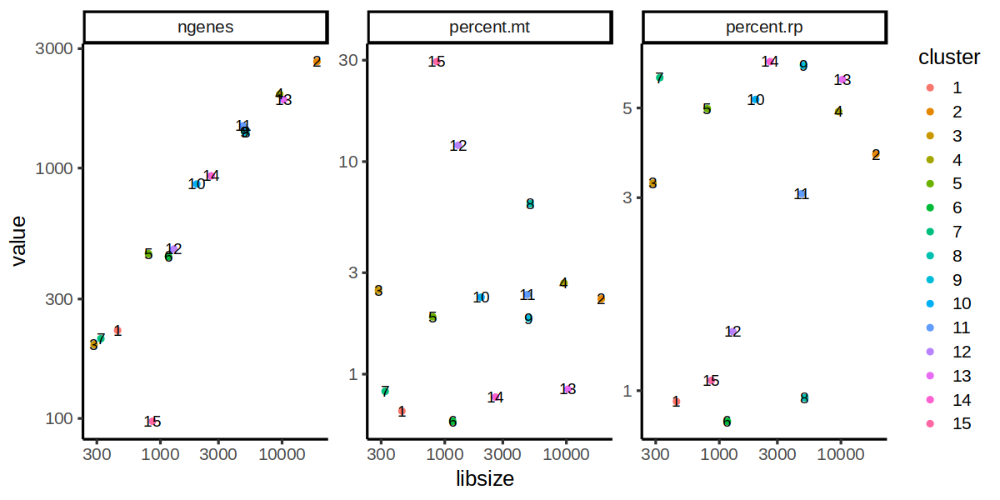

In [79]:
# Quality control - Classification
data <- as.data.frame(t(summarize_groups(t(as.matrix(exp(df-1))), ds$qc_cluster)))
data <- round(data, 2)
ds$quality <- "Good"
ds$quality[ds$qc_cluster %in% rownames(data)[which(data$percent.mt > 5)]] <- "Bad"
ds$quality <- factor(ds$quality)

# Plot
options(repr.plot.width=10, repr.plot.height=5)
head(data, 3)
data$cluster <- row.names(data)
data$cluster <- factor(data$cluster, sort(unique(as.numeric(data$cluster))))
data <- tidyr::gather(data, "metric", "value", -libsize, -cluster)
ggplot(data, aes(libsize, value, label = cluster, col = cluster)) +
geom_point() +
geom_text(col = "black") +
facet_wrap(~metric, scales = "free_y") +
theme_classic(15) +
scale_x_continuous(trans = "log10") +
scale_y_continuous(trans = "log10")

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5728 rows containing non-finite values (`stat_bin2d()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5728 rows containing non-finite values (`stat_bin2d()`).”


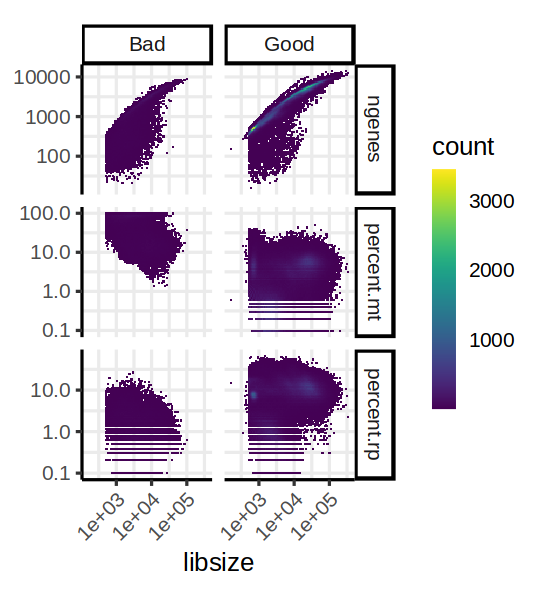

In [80]:
# Plot
options(repr.plot.width=4.5, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "quality")
fn <- paste0(plot_dir, "qc_quality", ".", "png")
ggsave(fn, width = 6, height = 6, bg="white", limitsize = FALSE)

In [81]:
# Quality control - Filter
cells <- colnames(ds)[which(!ds$quality == "Bad")]
paste("Removing", (1-round(length(cells) / ncol(ds), 4))*100, "% of cells")
ds <- subset(ds, cells = cells)

[1] "Removing 7.41000000000001 % of cells"

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5680 rows containing non-finite values (`stat_bin2d()`).”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5680 rows containing non-finite values (`stat_bin2d()`).”


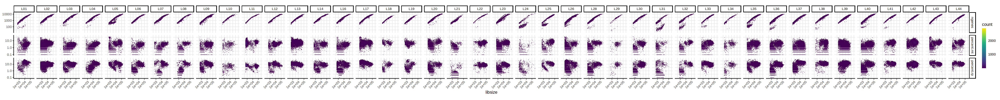

In [82]:
# Plot
options(repr.plot.width=50, repr.plot.height=5)
plot_qc_metrics(ds, split_by = "libname", split_by_max = 50)
fn <- paste0(plot_dir, "qc_lib-filtered", ".", "png")
ggsave(fn, width = 50, height = 5, bg="white", limitsize = FALSE)

In [83]:
unique(ds$lib_sample)

[1] "L01:BAL_1"     "L02:BAL_2"     "L03:BAL_3"     "L04:BAL_4"    
 [5] "L05:BAL_5"     "L06:BAL_6"     "L07:BAL_7"     "L08:BAL_8"    
 [9] "L09:BAL_9"     "L10:BAL_13"    "L11:BAL_14"    "L12:BAL_15"   
[13] "L13:BAL_16"    "L14:BAL_17"    "L16:BAL_19"    "L17:BAL_20"   
[17] "L18:BAL_21"    "L19:BAL_22"    "L20:BAL_23"    "L21:BAL_24"   
[21] "L22:BAL_25"    "L23:BAL_26"    "L24:BAL_27"    "L25:BAL_28"   
[25] "L26:BAL_30"    "L28:BAL_31"    "L29:BAL_32"    "L30:BAL_33"   
[29] "L31:BAL_34"    "L32:BAL_35"    "L33:BAL_36"    "L34:BAL_42"   
[33] "L35:BAL_43"    "L36:BAL_44"    "L36:BAL_45"    "L37:Undefined"
[37] "L37:BAL_47"    "L37:BAL_46"    "L38:BAL_48"    "L39:BAL_33"   
[41] "L39:BAL_31"    "L39:Doublet"   "L39:BAL_32"    "L39:Undefined"
[45] "L40:BAL_49"    "L40:BAL_50"    "L40:Undefined" "L41:BAL_51"   
[49] "L42:BAL_41"    "L42:BAL_39"    "L42:BAL_37"    "L42:BAL_40"   
[53] "L42:Doublet"   "L42:Undefined" "L43:BAL_52"    "L44:BAL_53"

In [84]:
# Transform data
ds <- NormalizeData(ds)
ds <- FindVariableFeatures(ds)
ds <- ScaleData(ds)
ds <- RunPCA(ds)

Centering and scaling data matrix

PC_ 1 
Positive:  SYNE2, PERP, TMC5, ANK3, PARD3, ELF3, SKAP1, KIAA1217, KIF21A, C12orf75 
	   INPP4B, SPAG16, TC2N, WFDC2, CD96, SYTL2, MAPK10, PATJ, PTPRK, CHST9 
	   KRT19, LMO7, FUT8, IL32, TSPAN1, MAGI1, CD2, FYN, SDK1, BCL11B 
Negative:  S100A9, FN1, APOE, FABP4, S100A8, CCL18, INHBA, LSAMP, CTSL, MME 
	   RETN, SCD, FABP3, HMOX1, MIR3945HG, APOC2, AC092691.1, IL1R2, RBP4, SPRED1 
	   IL1RN, CXCL8, IFIT2, IL1R1, TPRG1, CES1, TRHDE, AC005050.3, VCAN, TNFAIP6 
PC_ 2 
Positive:  SKAP1, CD2, CD96, IL32, THEMIS, BCL11B, CCL5, FYN, GZMA, CD247 
	   TRAC, SLFN12L, ETS1, IKZF3, TRBC2, ITK, PRKCQ, CARD11, CAMK4, PYHIN1 
	   GRAP2, FUT8, SAMD3, SLC38A1, SYNE2, TSPAN5, LINC01934, ADAM19, KLF12, INPP4B 
Negative:  APOE, KRT8, FN1, WFDC2, ELF3, TMC5, LSAMP, KRT19, FXYD3, TSPAN1 
	   CHST9, FABP4, MAPK10, CCL18, NAALADL2, KRT18, S100A9, PSD3, MUC4, FOXP2 
	   SPRED1, PARD3, NBEA, WDR49, ENAH, CTSL, MUC16, FHAD1, FMN1, LRRIQ1 
PC_ 3 
Positive:  STMN1, MKI67, T

In [85]:
# Integrate data
ds$batch <- paste(ds$libname, ds$sample, sep=":")
ds <- RunMNN(ds, batch = "batch")

Warning message:
“No columnames present in cell embeddings, setting to 'mnn_1:50'”


In [ ]:
# Calculate embedding & clusters
dims <- c(10, 20, 30, 40)
red <- c("pca", "mnn")
dr <- unlist(lapply(red, paste, dims, sep="_"))
for (i in dr) {
    print(paste("Computing embedding and clusters for", i))
    d = str_split(i, "_")[[1]][[2]]
    r = str_split(i, "_")[[1]][[1]]
    umap_key <- paste0(r, "_", d, "_umap")
    graph_key <- paste0(r, "_", d, "_graph")
    clust_key <- paste0(r, "_", d, "_cluster")
    if (umap_key %in% names(ds@reductions)) {
        print(paste("Reduction", umap_key, "has already been computed."))
} else if (!r %in% names(ds@reductions)) {
        print(paste0("Reduction '", r, "' not present. Aborting."))
    } else {
        print(paste("Running algorithms for reduction", r, "for", d, "components."))
        ds <- RunUMAP(ds, dims=1:d, reduction = r, reduction.key = umap_key, reduction.name = umap_key,
                      return.model = TRUE, verbose = FALSE)
        ds <- FindNeighbors(ds, dims=1:d, reduction = r, graph.name = graph_key)
        ds <- FindClusters(ds, algorithm = 3, graph.name = graph_key, resolution = 2)
        ds[[clust_key]] <- ds$seurat_clusters
    }
}

[1] "Computing embedding and clusters for pca_10"
[1] "Running algorithms for reduction pca for 10 components."


Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from pca_10_umap to pca10umap_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to pca10umap_”
Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 324709
Number of edges: 3078571

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.8395
Number of communities: 112
Elapsed time: 341 seconds


66 singletons identified. 46 final clusters.



[1] "Computing embedding and clusters for pca_20"
[1] "Running algorithms for reduction pca for 20 components."


Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from pca_20_umap to pca20umap_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to pca20umap_”
Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 324709
Number of edges: 3055286

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.8323
Number of communities: 357
Elapsed time: 311 seconds


304 singletons identified. 53 final clusters.



[1] "Computing embedding and clusters for pca_30"
[1] "Running algorithms for reduction pca for 30 components."


Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from pca_30_umap to pca30umap_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to pca30umap_”
Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 324709
Number of edges: 3046757

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.8312
Number of communities: 546
Elapsed time: 288 seconds


493 singletons identified. 53 final clusters.



[1] "Computing embedding and clusters for pca_40"
[1] "Running algorithms for reduction pca for 40 components."


Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from pca_40_umap to pca40umap_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to pca40umap_”
Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 324709
Number of edges: 3041351

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.8338
Number of communities: 735
Elapsed time: 272 seconds


671 singletons identified. 64 final clusters.



[1] "Computing embedding and clusters for mnn_10"
[1] "Running algorithms for reduction mnn for 10 components."


Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from mnn_10_umap to mnn10umap_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to mnn10umap_”
Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 324709
Number of edges: 3104492

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.8094
Number of communities: 120
Elapsed time: 390 seconds


83 singletons identified. 37 final clusters.



[1] "Computing embedding and clusters for mnn_20"
[1] "Running algorithms for reduction mnn for 20 components."


Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from mnn_20_umap to mnn20umap_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to mnn20umap_”
Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 324709
Number of edges: 3174915

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.8121
Number of communities: 221
Elapsed time: 333 seconds


181 singletons identified. 40 final clusters.



[1] "Computing embedding and clusters for mnn_30"
[1] "Running algorithms for reduction mnn for 30 components."


Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from mnn_30_umap to mnn30umap_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to mnn30umap_”
Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 324709
Number of edges: 3189466

Running smart local moving algorithm...
Maximum modularity in 10 random starts: 0.8046
Number of communities: 372
Elapsed time: 305 seconds


338 singletons identified. 34 final clusters.



[1] "pca"         "mnn"         "pca_10_umap" "pca_20_umap" "pca_30_umap"
 [6] "pca_40_umap" "mnn_10_umap" "mnn_20_umap" "mnn_30_umap" "mnn_40_umap"

Warning message in plot_embedding(ds, embedding = emb):
“Expression/metadata for '' not found.”


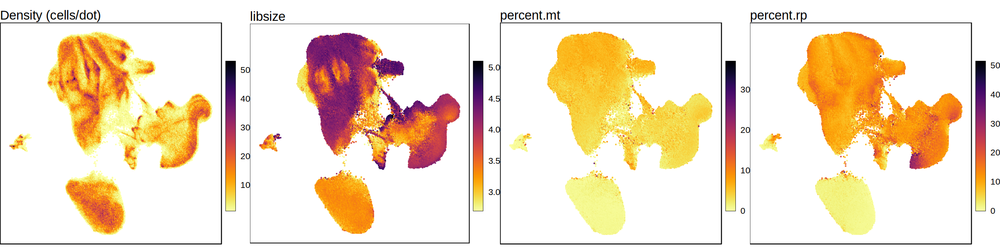

In [117]:
# Plot
options(repr.plot.width=20, repr.plot.height=5)
names(ds@reductions)
emb <- "mnn_20_umap"
cowplot::plot_grid(
    plot_embedding(ds, embedding=emb),
    plot_embedding(ds, "libsize", embedding=emb, color.transform="log10"),
    plot_embedding(ds, "percent.mt", embedding=emb),
    plot_embedding(ds, "percent.rp", embedding=emb), nrow = 1
)

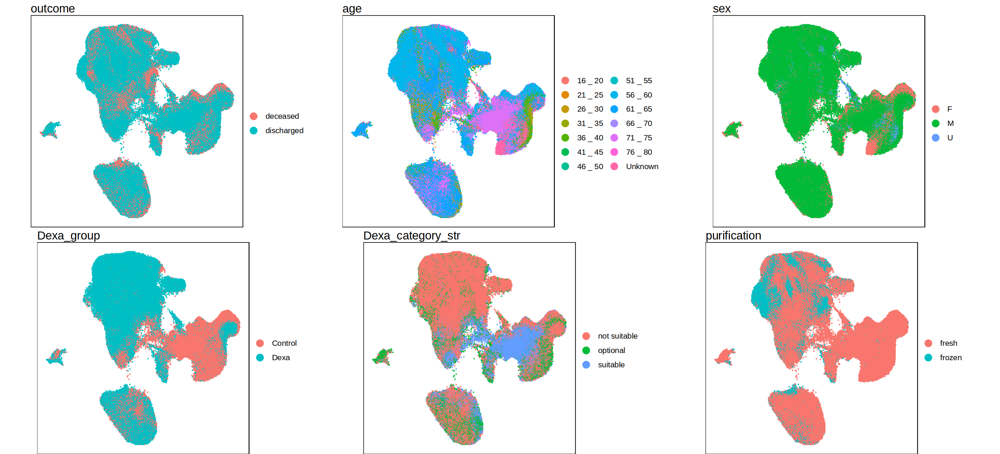

In [118]:
# Plot
options(repr.plot.width=22, repr.plot.height=10)
cowplot::plot_grid(
    plot_embedding(ds, "outcome", embedding=emb),
    plot_embedding(ds, "age", embedding=emb),
    plot_embedding(ds, "sex", embedding=emb), 
    plot_embedding(ds, "Dexa_group", embedding=emb), 
    plot_embedding(ds, "Dexa_category_str", embedding=emb), 
    plot_embedding(ds, "purification", embedding=emb), 
    nrow = 2
)

Warning message in plot_embedding(ds, split.by = "outcome", embedding = emb):
“Expression/metadata for '' not found.”


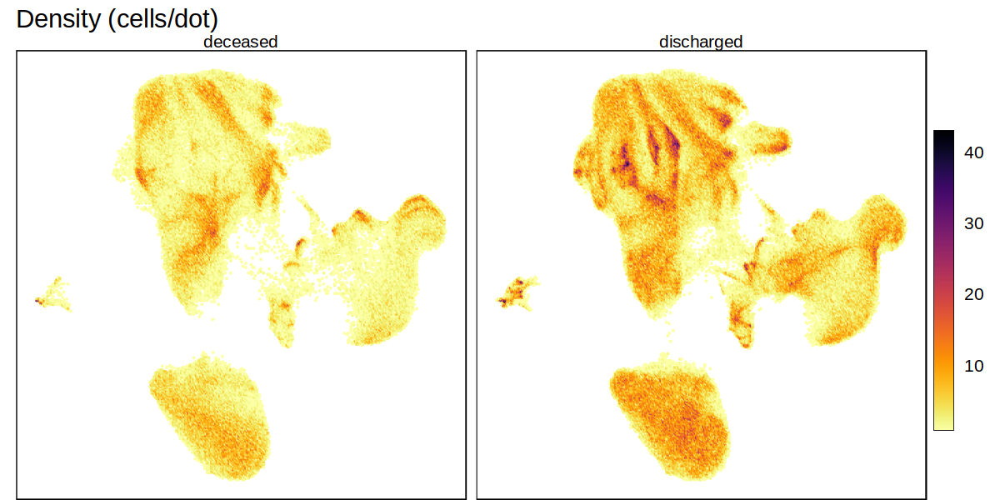

In [119]:
# Plot
options(repr.plot.width=10, repr.plot.height=5)
plot_embedding(ds, split.by = "outcome", embedding=emb)

Warning message in plot_embedding(ds, split.by = "age", embedding = emb, split.by.rows = 2):
“Expression/metadata for '' not found.”


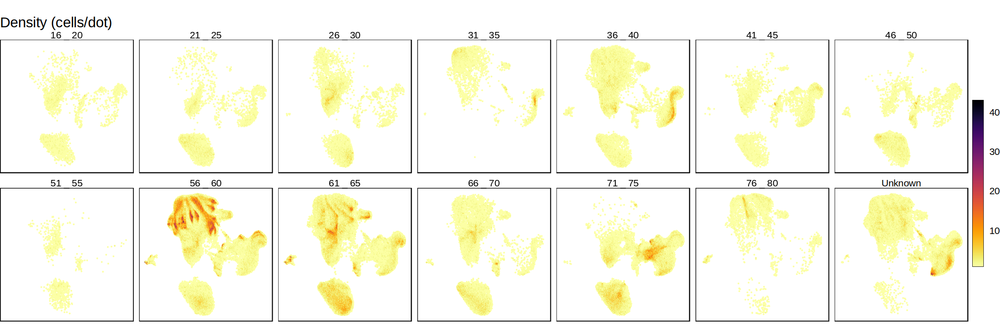

In [120]:
# Plot
options(repr.plot.width=18, repr.plot.height=6)
plot_embedding(ds, split.by = "age", embedding=emb, split.by.rows = 2)

Warning message in plot_embedding(ds, split.by = "sex", embedding = emb):
“Expression/metadata for '' not found.”


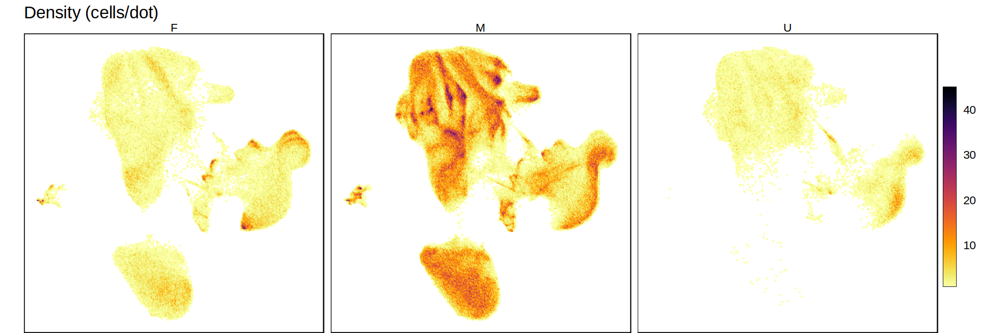

In [123]:
# Plot
options(repr.plot.width=15, repr.plot.height=5)
plot_embedding(ds, split.by = "sex", embedding=emb)

Warning message in plot_embedding(ds, split.by = "Dexa_group", embedding = emb):
“Expression/metadata for '' not found.”


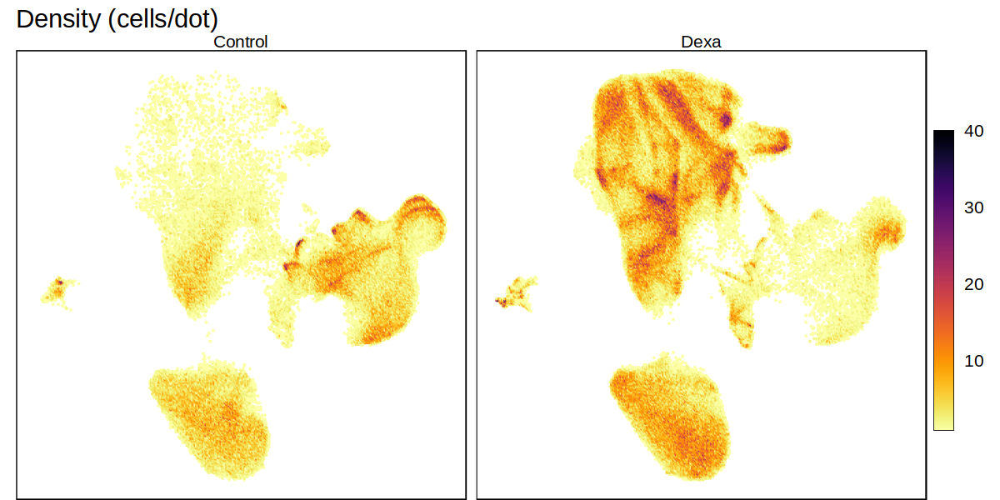

In [126]:
# Plot
options(repr.plot.width=10, repr.plot.height=5)
plot_embedding(ds, split.by = "Dexa_group", embedding=emb)

Warning message in plot_embedding(ds, split.by = "purification", embedding = emb):
“Expression/metadata for '' not found.”


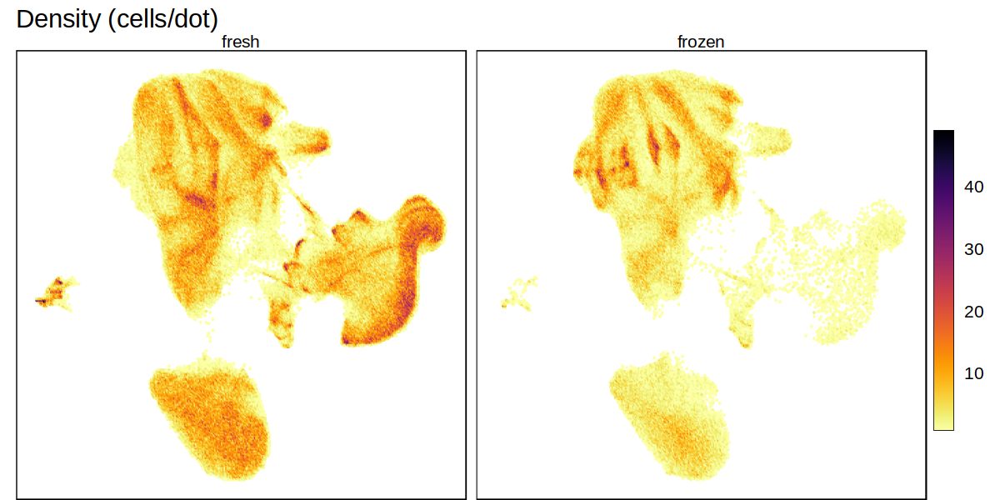

In [131]:
# Plot
options(repr.plot.width=10, repr.plot.height=5)
plot_embedding(ds, split.by = "purification", embedding=emb)

In [132]:
# Transfer cohort A annotations
dat <- read.csv(in_meta_promac)

# Cell type
ds$ann_cohort_A <- "None"
ds$ann_cohort_A[ds$cohort == "A"] <- "Low quality"
index <- colnames(ds) %in% rownames(dat)
ds$ann_cohort_A[index] <- dat$Celltype[match(colnames(ds)[index], rownames(dat))]

# Macrophage cluster
ds$mac_cohort_A <- "None"
ds$mac_cohort_A[ds$cohort == "A"] <- "Low quality"
index <- colnames(ds) %in% rownames(dat)
ds$mac_cohort_A[index] <- dat$mac_type[match(colnames(ds)[index], rownames(dat))]

Warning message in plot_embedding(ds, embedding = emb, theme.size = 20):
“Expression/metadata for '' not found.”


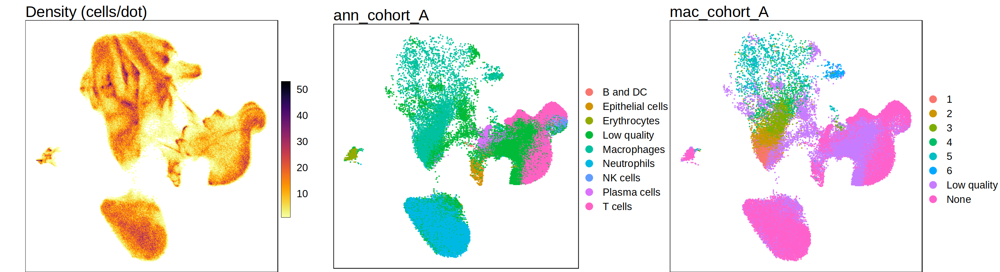

In [133]:
# Plot
options(repr.plot.width=22, repr.plot.height=6)
cells <- colnames(ds)[ds$ann_cohort_A != "None"]
pl <- list(
    plot_embedding(ds, embedding=emb, theme.size=20),
    plot_embedding(ds, "ann_cohort_A", embedding = emb, theme.size = 20, cells=cells),
    plot_embedding(ds, "mac_cohort_A", embedding = emb, theme.size = 20, cells=cells)
)
plot_grid(plotlist = pl, nrow = 1)

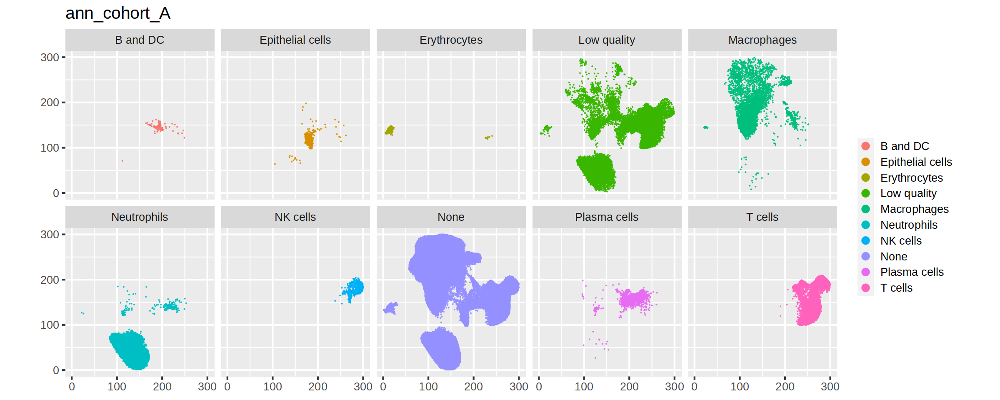

In [137]:
# Plot
options(repr.plot.width=20, repr.plot.height=8)
plot_embedding(ds, "ann_cohort_A", split.by = "ann_cohort_A", embedding = emb, split.by.rows = 2) + 
ggplot2::theme_grey(20) + ggplot2::labs(x=NULL, y=NULL)

In [139]:
# Annotation - Cell type AUC
dict <- markers$celltype
gsets <- split(dict$gene, dict$type)
ds <- AddAUC(ds, gsets, "celltype.auc")

ERROR: Error in AddAUC(ds, gsets, "celltype.auc"): Assay celltype.auc  already exists. 
               To replace set force.recalc = TRUE


Warning message in plot_markers_embedding(ds, assay = "celltype.auc", scale = FALSE, :
“No markers specified. Defaulting to whole assay.”


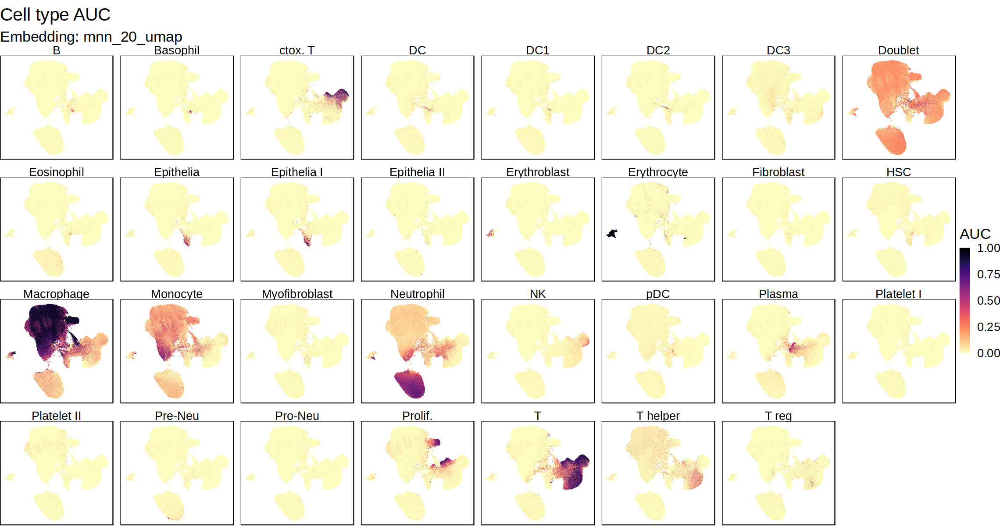

In [140]:
# Plot
options(repr.plot.width=19, repr.plot.height=10)
plot_markers_embedding(ds, assay = "celltype.auc", scale = FALSE, pt.size = .1, pt.stroke = .1, nrow = 4,
                       pl.title = "Cell type AUC", col.title = "AUC", embedding = emb)
fn <- paste0(plot_dir, "pca-umap_celltype-markers-AUC", ".", "png")
ggsave(fn, width = 20, height = 10, bg="white", limitsize = FALSE)

In [141]:
# Plot
p <- plot_markers_embedding(ds, unlist(gsets))
fn <- paste0(plot_dir, emb, "_", "celltype-markers", ".", "png")
ggsave(fn, p, width = 20, height = 20, bg="white", limitsize = FALSE)

In [ ]:
# Cluster cells
res <- 3
graph_key <- str_replace(emb, "umap", "graph")
clust <- str_replace(emb, "umap", "cluster")
d <- str_split(emb, "_", simplify=T)[, 2]
r <- str_split(emb, "_", simplify=T)[, 1]
ds <- FindNeighbors(ds, dims=1:d, reduction = r, graph.name = graph_key)
ds <- FindClusters(ds, algorithm = 3, graph.name = graph_key, resolution = res)
ds[[clust]] <- ds$seurat_clusters

Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



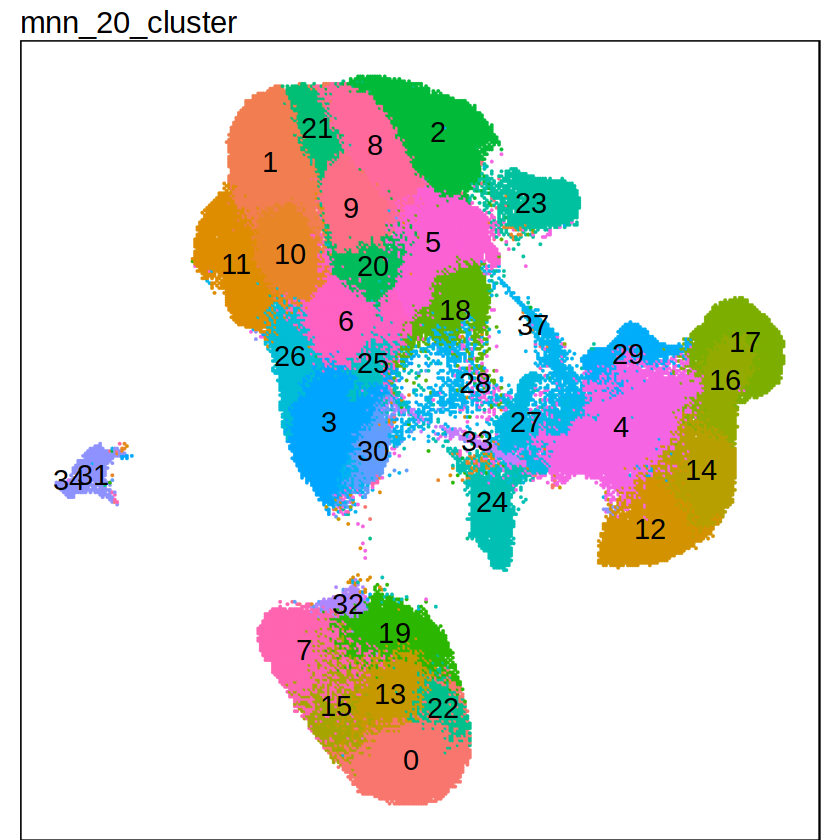

In [221]:
# Plot
options(repr.plot.width=7, repr.plot.height=7)
clust <- str_replace(emb, "umap", "cluster")
plot_embedding(ds, clust, label = "text", embedding = emb)

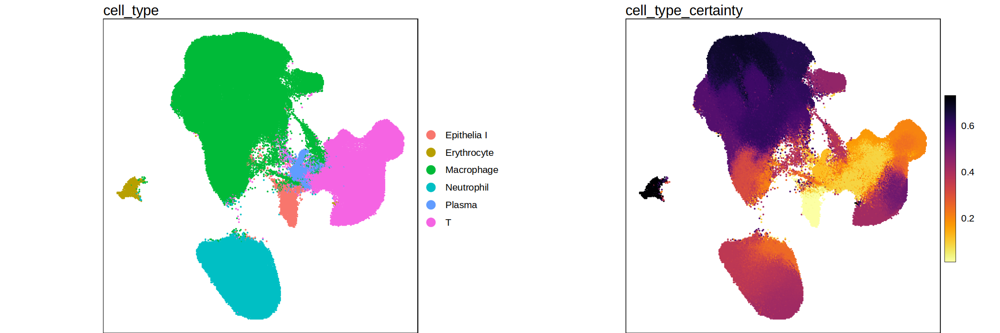

In [222]:
# Annotate
ds <- SeuratHelper::annotate_maxAUC(ds, assay = "celltype.auc", group.by = clust)

# Plot
options(repr.plot.width=18, repr.plot.height=6)
cowplot::plot_grid(
    plot_embedding(ds, "cell_type", legend.cols = 1, embedding=emb),
    plot_embedding(ds, "cell_type_certainty", embedding=emb), 
    rel_widths = c(1.5, 1)
    )

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5680 rows containing non-finite values (`stat_bin2d()`).”


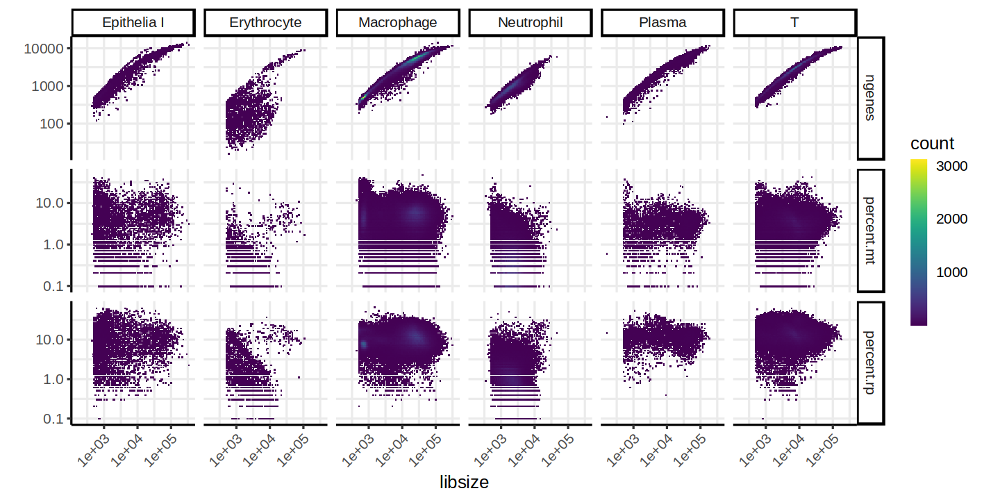

In [223]:
# Cell type QC
options(repr.plot.width=12, repr.plot.height=6)
plot_qc_metrics(ds, split_by = "cell_type", split_by_max = 20)

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“ggrepel: 38 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 38 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 39 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 38 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 40 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 38 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 39 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 38 unlabeled data points (too many overlaps). Consider incre

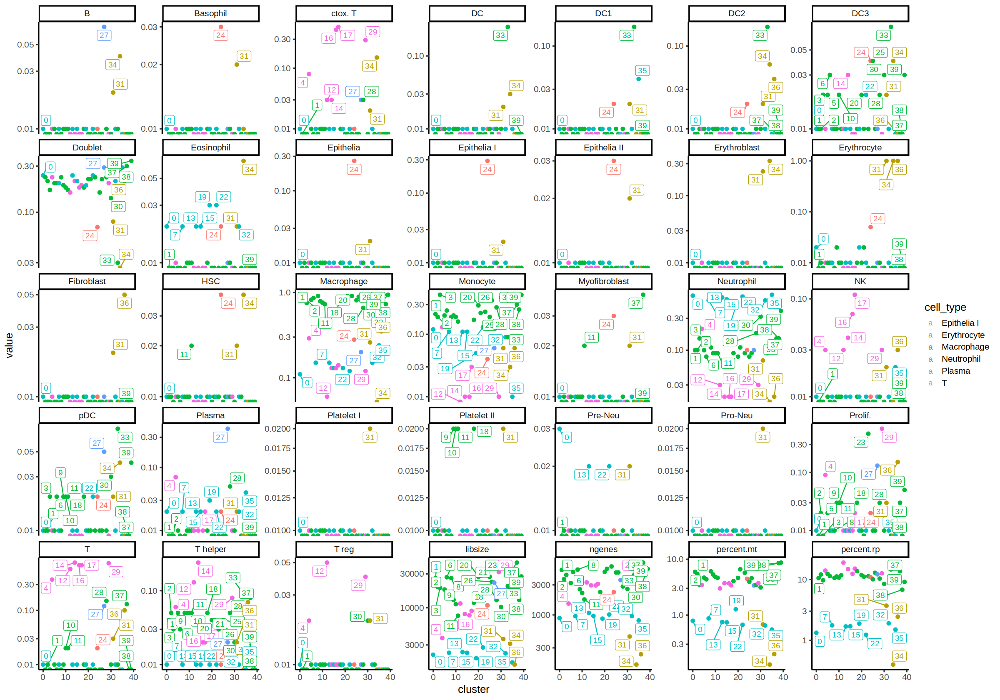

In [224]:
# Refine annotation
df <- as.data.frame(t(ds[["celltype.auc"]]@data))
df <- cbind(df, ds@meta.data[, c("libsize", "ngenes", "percent.mt", "percent.rp")])
lvl <- colnames(df)
df <- t(summarize_groups(t(as.matrix(df)), ds@meta.data[[clust]]))
df <- as.data.frame(round(df, 2))
df$cluster <- rownames(df)
data <- unique(ds@meta.data[, c("cell_type", clust)])
ind <- match(df$cluster, data[[clust]])
df$cell_type <- data[["cell_type"]][ind]
df$cluster <- as.numeric(df$cluster)
data <- tidyr::gather(df, "metric", "value", -cluster, -cell_type)
data$metric <- factor(data$metric, lvl)

# Plot
options(repr.plot.width=20, repr.plot.height=14)
ggplot(data, aes(cluster, value, label = cluster, col = cell_type)) +
geom_point(size = 2) +
ggrepel::geom_label_repel(size=4) +
facet_wrap(~metric, scales = "free_y", nrow = 5) +
theme_classic(15) +
scale_y_continuous(trans = "log10")

In [231]:
# Refine annotation
df$cell_type <- as.character(df$cell_type)
ds$celltype <- as.character(ds$cell_type)

# Low quality cells
index <- list(
    rownames(df)[which(df$cell_type == "Macrophage" & df[["T"]] > 0.10)],
    rownames(df)[which(df$cell_type == "T" & df[["Macrophage"]] > 0.25)]
)
index <- unlist(index)
ds$celltype[ds@meta.data[[clust]] %in% index] <- "Low quality"

# Monocytes
index <- rownames(df)[which(df$cell_type == "Macrophage" & df[["Monocyte"]] > 0.37)]
ds$celltype[ds@meta.data[[clust]] %in% index] <- "Monocyte"

# Epithelia
index <- rownames(df)[which(df[["Epithelia"]] > 0.12)]
ds$celltype[ds@meta.data[[clust]] %in% index] <- "Epithelia"

# DC
index <- rownames(df)[which(df[["DC"]] > 0.05)]
ds$celltype[ds@meta.data[[clust]] %in% index] <- "DC"

# Fibroblast
index <- rownames(df)[which(df[["Fibroblast"]] > 0.025)]
ds$celltype[ds@meta.data[[clust]] %in% index] <- "Fibroblast"

# Convert to factor
x <- rownames(ds@assays$celltype.auc)
lvl <- c(x[which(x %in% ds$celltype)], "Low quality")
ds$celltype <- factor(ds$celltype, lvl)

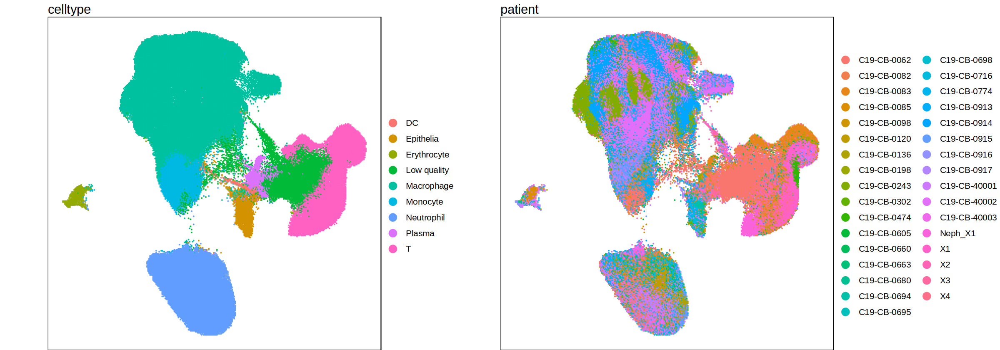

In [232]:
# Plot
options(repr.plot.width=20, repr.plot.height=7)
cowplot::plot_grid(
    plot_embedding(ds, "celltype", legend.cols = 1, embedding=emb),
    plot_embedding(ds, "patient", legend.cols = 2, embedding=emb)
    )

Warning message:
“Transformation introduced infinite values in continuous y-axis”
Warning message:
“Removed 5680 rows containing non-finite values (`stat_bin2d()`).”


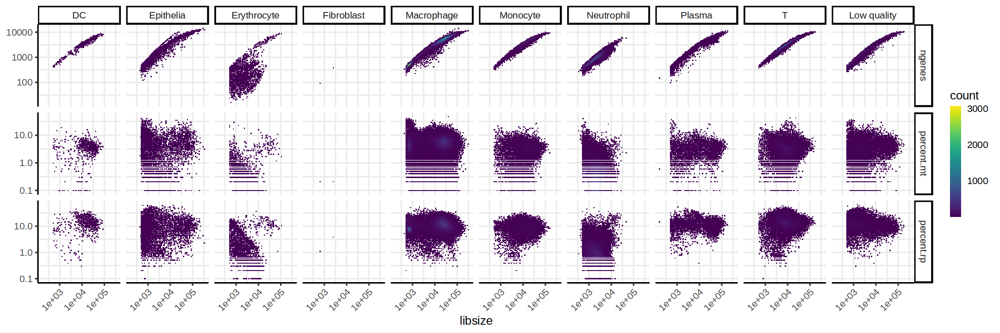

In [237]:
# Cell type QC
# To be determined: low libsize macrophages, high RP neutrophils (immature), low libsize plasma cells
options(repr.plot.width=18, repr.plot.height=6)
plot_qc_metrics(ds, split_by = "celltype", split_by_max = 20)

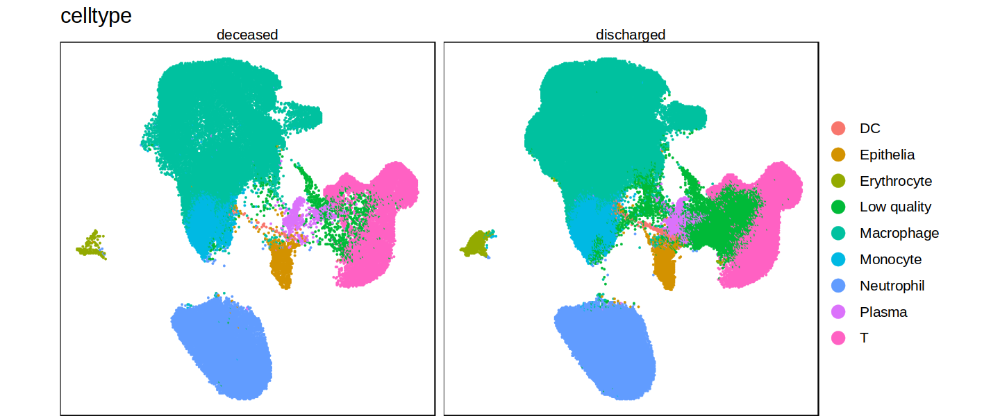

In [238]:
# Plot
options(repr.plot.width=12, repr.plot.height=5)
plot_embedding(ds, "celltype", legend.cols = 1, split.by = "outcome", embedding=emb)
fn <- paste0(plot_dir, emb, "_", "celltype-outcome", ".", "png")
ggsave(fn, width = 15, height = 5, bg="white", limitsize = FALSE)

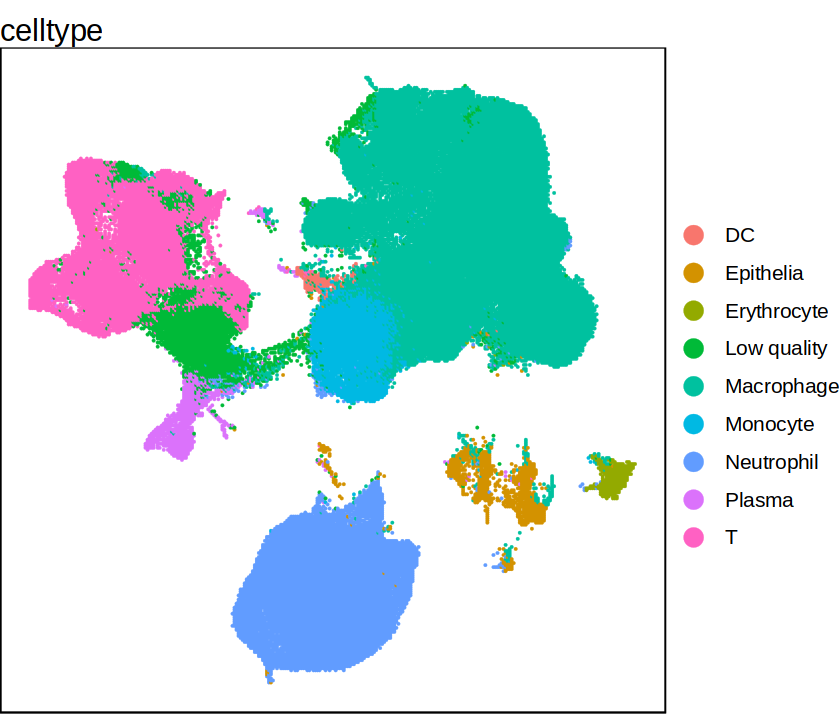

In [248]:
options(repr.plot.width=7, repr.plot.height=6)
plot_embedding(ds, "celltype", legend.cols = 1, embedding="pca_40_umap")

[1] "B"             "Basophil"      "ctox. T"       "DC"           
 [5] "DC1"           "DC2"           "DC3"           "Doublet"      
 [9] "Eosinophil"    "Epithelia"     "Epithelia I"   "Epithelia II" 
[13] "Erythroblast"  "Erythrocyte"   "Fibroblast"    "HSC"          
[17] "Macrophage"    "Monocyte"      "Myofibroblast" "Neutrophil"   
[21] "NK"            "pDC"           "Plasma"        "Platelet I"   
[25] "Platelet II"   "Pre-Neu"       "Pro-Neu"       "Prolif."      
[29] "T"             "T helper"      "T reg"

Expression/metadata found in different assay. Switching to celltype.auc



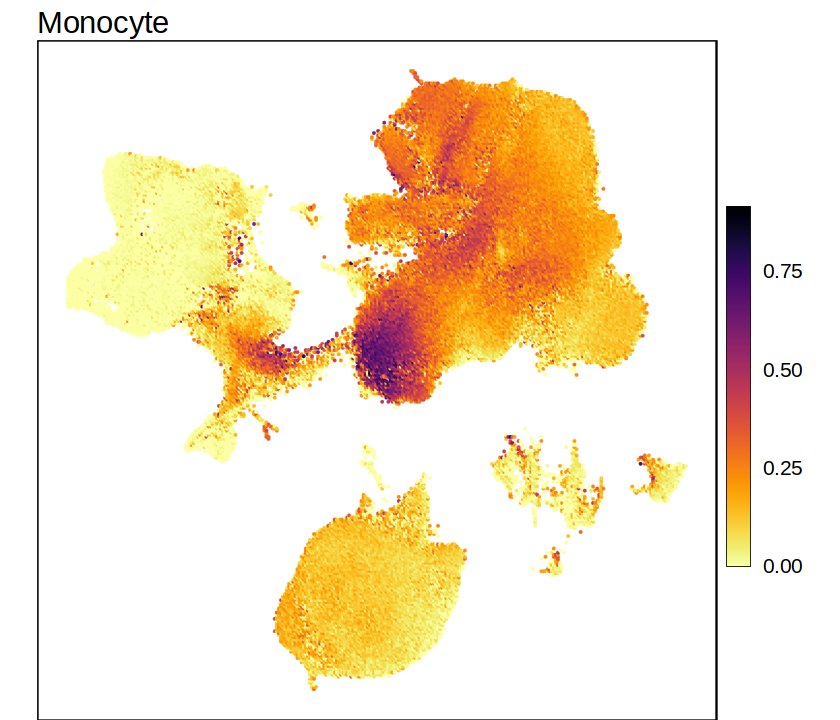

In [276]:
options(repr.plot.width=7, repr.plot.height=6)
rownames(ds[["celltype.auc"]])
plot_embedding(ds, "Monocyte", legend.cols = 1, embedding="pca_40_umap")

In [239]:
# Save data
saveRDS(ds, out_file)

In [240]:
sessionInfo()

R version 4.3.1 (2023-06-16)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: AlmaLinux 8.5 (Arctic Sphynx)

Matrix products: default
BLAS/LAPACK: /home/odietric/miniconda3/envs/covid19-bal-atlas/lib/libopenblasp-r0.3.24.so;  LAPACK version 3.11.0

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=de_DE.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=de_DE.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=de_DE.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=de_DE.UTF-8 LC_IDENTIFICATION=C       

time zone: Europe/Berlin
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] SeuratHelper_0.0.0.9000 cowplot_1.1.1           readxl_1.4.3           
[4] ggplot2_3.4.3           tidyr_1.3.0             stringr_1.5.0          
[7] dplyr_1.1.3             SeuratObject_4.1.4  